# CISC3014 project
# Predicting market price

## Preparing packages

## Import dictionary

In [2]:
import numpy as np
import pandas as pd
pd.core.common.is_list_like = pd.api.types.is_list_like
import pandas_datareader as web

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use('fivethirtyeight')
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode
init_notebook_mode(connected = True)
%matplotlib inline

from pandas_datareader.data import DataReader
import yfinance as yf

from datetime import datetime

## Set goal: The top 10 biggest companies in the US (updated to NASDAQ 8/10/2022)

In [3]:
tech_list = ['AAPL', 'MSFT', 'GOOG',  'AMZN', 'V']

end = datetime.now()
start = datetime(2000, 1, 1)

for stock in tech_list:
    globals()[stock] = yf.download(stock, start, end)

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [4]:
company_list = [AAPL, MSFT, GOOG, AMZN, V]
company_name = ['APPLE', 'MICROSOFT', 'GOOGLE', 'AMAZON', 'VISA']

for company, com_name in zip(company_list, company_name):
    company['company_name'] = com_name
    
df = pd.concat(company_list, axis = 0)
df

,Open,High,Low,Close,Adj Close,Volume,company_name
Date,,,,,,,
2000-01-03,0.936384,1.004464,0.907924,0.999442,0.847207,535796800,APPLE
2000-01-04,0.966518,0.987723,0.903460,0.915179,0.775779,512377600,APPLE
2000-01-05,0.926339,0.987165,0.919643,0.928571,0.787131,778321600,APPLE
2000-01-06,0.947545,0.955357,0.848214,0.848214,0.719014,767972800,APPLE
2000-01-07,0.861607,0.901786,0.852679,0.888393,0.753073,460734400,APPLE
...,...,...,...,...,...,...,...
2023-11-22,253.000000,254.539993,252.660004,253.720001,253.720001,5701400,VISA
2023-11-24,254.190002,254.699997,253.500000,254.300003,254.300003,1640900,VISA
2023-11-27,254.300003,254.979996,252.520004,254.139999,254.139999,5478900,VISA


## **Historical view of the closing price**

In [5]:
fig = px.area(df, facet_col = 'company_name', x = df.index, y = 'Close', facet_col_wrap = 3, color = 'company_name', template = 'plotly_dark')
fig.show()

## **Sales volume per stock**

In [6]:
fig = px.area(df, facet_col = 'company_name', x = df.index, y = 'Volume', facet_col_wrap = 5, color = 'company_name', template = 'plotly_dark')
fig.show()

## **Daily return**

In [7]:
df['Daily Return'] = df['Adj Close'].pct_change()

In [8]:
fig = px.line(df, facet_col = 'company_name', x = df.index, y = 'Daily Return', facet_col_wrap = 3, color = 'company_name', template = 'plotly_dark')
fig.show()

In [9]:
fig = px.histogram(df, x = 'company_name', y = 'Daily Return', color = 'company_name', template = 'plotly_dark')
fig.show()

## **Correlations between stocks**

In [10]:
tech_list = ['AAPL', 'MSFT', 'GOOG',  'AMZN', 'V']

end = datetime.now()
start = datetime(2000, 1, 1)

closing_df = pd.DataFrame()

# Fetch the data for each symbol and concatenate it to the DataFrame
for symbol in tech_list:
    df = yf.download(symbol, start=start, end=end)['Adj Close']
    closing_df[symbol] = df
closing_df.head()

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


,AAPL,MSFT,GOOG,AMZN,V
Date,,,,,
2000-01-03,0.847207,36.132267,NaN,4.468750,NaN
2000-01-04,0.775779,34.911713,NaN,4.096875,NaN
2000-01-05,0.787131,35.279804,NaN,3.487500,NaN
2000-01-06,0.719014,34.098011,NaN,3.278125,NaN
2000-01-07,0.753073,34.543591,NaN,3.478125,NaN


In [11]:
daily = closing_df.pct_change()
daily.head()

C:\Users\steve\AppData\Local\Temp\ipykernel_3528\3695573416.py:1: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Call ffill before calling pct_change to retain current behavior and silence this warning.



,AAPL,MSFT,GOOG,AMZN,V
Date,,,,,
2000-01-03,NaN,NaN,NaN,NaN,NaN
2000-01-04,-0.084310,-0.033780,NaN,-0.083217,NaN
2000-01-05,0.014633,0.010543,NaN,-0.148741,NaN
2000-01-06,-0.086538,-0.033498,NaN,-0.060036,NaN
2000-01-07,0.047369,0.013068,NaN,0.061010,NaN


In [12]:
fig = px.scatter(daily, x = 'V', y = 'V', marginal_x = 'histogram', marginal_y = 'histogram', template = 'plotly_dark', trendline = 'ols')
fig.show()

##### **Obviously, there is linearity between Visa and itself.**

In [13]:
fig = px.scatter(daily, x = 'AAPL', y = 'V', marginal_x = 'histogram', marginal_y = 'histogram', template = 'plotly_dark', trendline = 'ols')
fig.show()

##### **There is a weak and positive correlation between Apple and Visa.**

In [14]:
fig = px.scatter(daily, x = 'AAPL', y = 'MSFT', marginal_x = 'histogram', marginal_y = 'histogram', template = 'plotly_dark', trendline = 'ols')
fig.show()

##### **There is a weak positive correlation between Apple and Microsoft**

In [15]:
fig = px.scatter_matrix(daily, template = 'plotly_dark')
fig.show()

<Axes: >

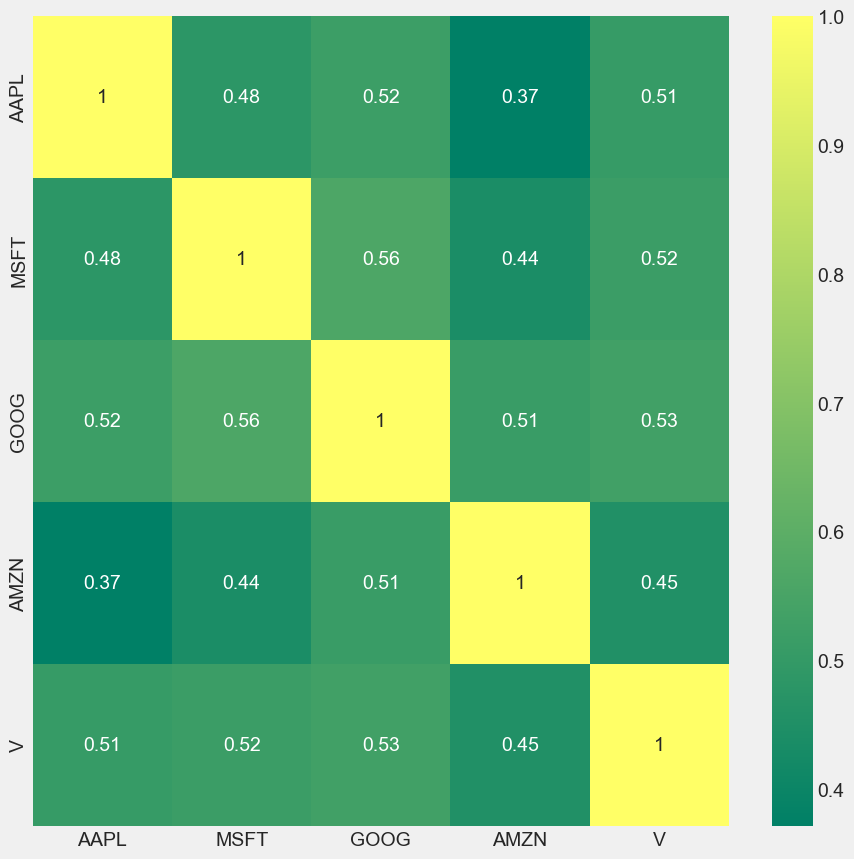

In [16]:
plt.figure(figsize = (10, 10))
sns.heatmap(daily.corr(), annot = True, cmap = 'summer')

##### **The highest correlation to daily returns is between Google and Microsoft, i.e. there is a weak positive correlation of 0.55**

## **Risk and return**

In [17]:
risk = daily.dropna()

In [18]:
area = np.pi * 20

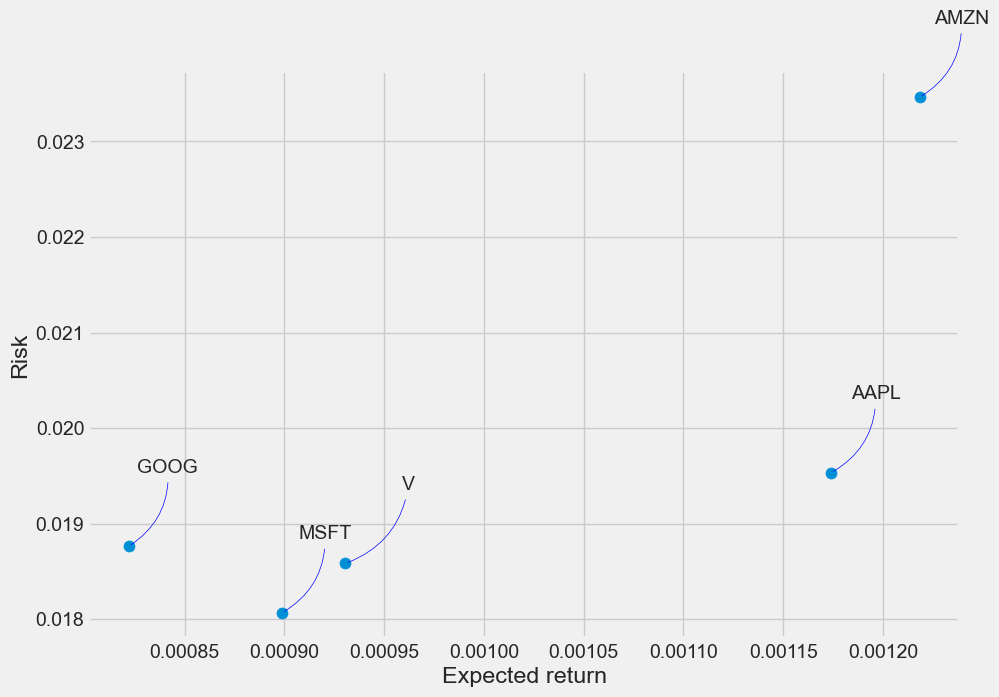

In [19]:
plt.figure(figsize=(10, 7))
plt.scatter(risk.mean(), risk.std(), s=area)
plt.xlabel('Expected return')
plt.ylabel('Risk')

for label, x, y in zip(risk.columns, risk.mean(), risk.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom', 
                 arrowprops=dict(arrowstyle='-', color='blue', connectionstyle='arc3,rad=-0.3'))

##### **Netflix has a high return but a high risk, while Apple has a high return for a moderate risk, so it would be worth investing in Apple if you have the moderate profile.**

## **Predicting AAPL's closing price**

In [20]:
df2 = yf.download('AAPL', start, end)
df2

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-03,0.936384,1.004464,0.907924,0.999442,0.847207,535796800
2000-01-04,0.966518,0.987723,0.903460,0.915179,0.775779,512377600
2000-01-05,0.926339,0.987165,0.919643,0.928571,0.787131,778321600
2000-01-06,0.947545,0.955357,0.848214,0.848214,0.719014,767972800
2000-01-07,0.861607,0.901786,0.852679,0.888393,0.753073,460734400
...,...,...,...,...,...,...
2023-11-21,191.410004,191.520004,189.740005,190.639999,190.639999,38134500
2023-11-22,191.490005,192.929993,190.830002,191.309998,191.309998,39617700
2023-11-24,190.869995,190.899994,189.250000,189.970001,189.970001,24048300


## Method (OHLC)

In [21]:
fig = go.Figure(data=[go.Candlestick(x=df2.index,
                open=df2['Open'],
                high=df2['High'],
                low=df2['Low'],
                close=df2['Close'])])

fig.show()

## Training/testing spliting
### Training/Testing ratio: 8:2

In [22]:
data = df2.filter(['Close'])
dataset = data.values
training_data_len = int(np.ceil( len(dataset) * .80 ))
training_data_len


4812

## Data Preporcessing

In [23]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(dataset)

scaled_data

array([[0.00389957],
       [0.00347012],
       [0.00353838],
       ...,
       [0.96697514],
       [0.96605775],
       [0.96916657]])

In [24]:
train_data = scaled_data[0:int(training_data_len), :]

x_train = []
y_train = []

for i in range(60, len(train_data)):
    x_train.append(train_data[i-60:i, 0])
    y_train.append(train_data[i, 0])
    if i<= 61:
        print(x_train)
        print(y_train)
        print()
        
x_train, y_train = np.array(x_train), np.array(y_train)

x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))    # data reshaping

[array([0.00389957, 0.00347012, 0.00353838, 0.00312884, 0.00333361,
       0.00325398, 0.00302646, 0.00277335, 0.00320847, 0.00337627,
       0.00353553, 0.00365498, 0.00397067, 0.00387113, 0.00364076,
       0.00391378, 0.00381993, 0.0038114 , 0.00343031, 0.003527  ,
       0.00336774, 0.00330232, 0.00350709, 0.0037204 , 0.00399626,
       0.00403323, 0.00393085, 0.00397067, 0.00375452, 0.00407589,
       0.00422094, 0.0039991 , 0.00403323, 0.00386828, 0.00398488,
       0.0040958 , 0.00404816, 0.00382847, 0.00395929, 0.00402186,
       0.0047357 , 0.00435745, 0.00463047, 0.00452524, 0.00439726,
       0.00435745, 0.00436882, 0.00452809, 0.00432616, 0.00400479,
       0.0040958 , 0.00433754, 0.00449396, 0.00440295, 0.00494615,
       0.00536706, 0.00523624, 0.00511679, 0.00515661, 0.0051367 ])]
[0.004991659184319]

[array([0.00389957, 0.00347012, 0.00353838, 0.00312884, 0.00333361,
       0.00325398, 0.00302646, 0.00277335, 0.00320847, 0.00337627,
       0.00353553, 0.00365498, 0.0039

In [25]:
from keras.models import Sequential
from keras.layers import Dense, LSTM

# Build the LSTM model
model = Sequential()
model.add(LSTM(128, return_sequences=True, input_shape= (x_train.shape[1], 1)))
model.add(LSTM(64, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(x_train, y_train, batch_size=1, epochs=10)

Epoch 1/10
4752/4752 [==============================] - 56s 11ms/step - loss: 1.0875e-04
Epoch 2/10
4752/4752 [==============================] - 54s 11ms/step - loss: 3.2613e-05
Epoch 3/10
4752/4752 [==============================] - 53s 11ms/step - loss: 2.4441e-05
Epoch 4/10
4752/4752 [==============================] - 53s 11ms/step - loss: 2.2438e-05
Epoch 5/10
4752/4752 [==============================] - 53s 11ms/step - loss: 1.7875e-05
Epoch 6/10
4752/4752 [==============================] - 53s 11ms/step - loss: 1.6635e-05
Epoch 7/10
4752/4752 [==============================] - 53s 11ms/step - loss: 1.4489e-05
Epoch 8/10
4752/4752 [==============================] - 53s 11ms/step - loss: 1.2180e-05
Epoch 9/10
4752/4752 [==============================] - 52s 11ms/step - loss: 1.3140e-05
Epoch 10/10
4752/4752 [==============================] - 52s 11ms/step - loss: 1.2712e-05


In [26]:
# Create the testing data set
# Create a new array containing scaled values from index 1543 to 2002 
test_data = scaled_data[training_data_len - 60: , :]
# Create the data sets x_test and y_test
x_test = []
y_test = dataset[training_data_len:, :]
for i in range(60, len(test_data)):
    x_test.append(test_data[i-60:i, 0])
    
# Convert the data to a numpy array
x_test = np.array(x_test)

# Reshape the data
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))

# Get the models predicted price values 
predictions = model.predict(x_test)
predictions = scaler.inverse_transform(predictions)

# Get the root mean squared error (RMSE)
rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
rmse

38/38 [==============================] - 1s 13ms/step


15.313455311784619

# Validation set

In [27]:
train = data[:training_data_len]
valid = data[training_data_len:]
valid['Predictions'] = predictions

C:\Users\steve\AppData\Local\Temp\ipykernel_3528\2657761684.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



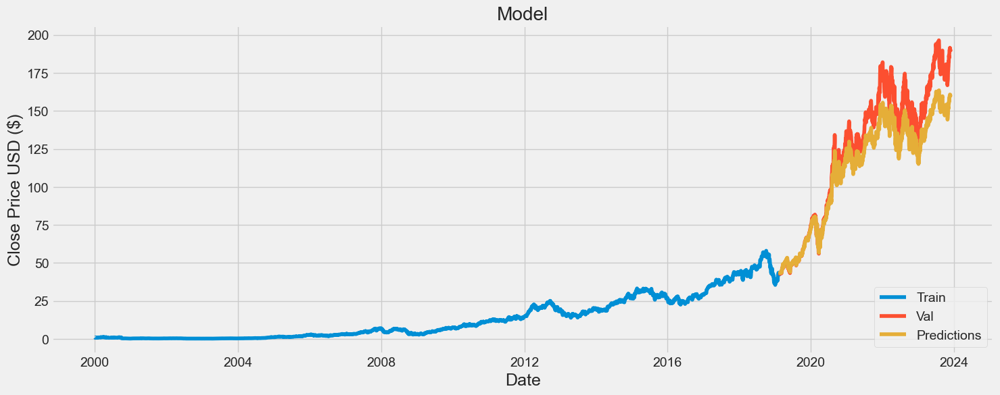

In [28]:
plt.figure(figsize=(16,6))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(train['Close'])
plt.plot(valid[['Close', 'Predictions']])
plt.legend(['Train', 'Val', 'Predictions'], loc='lower right')
plt.show()

In [29]:
valid

,Close,Predictions
Date,,
2019-02-20,43.007500,43.226101
2019-02-21,42.764999,43.532902
2019-02-22,43.242500,43.262100
2019-02-25,43.557499,43.805595
2019-02-26,43.582500,44.104038
...,...,...
2023-11-21,190.639999,160.799759
2023-11-22,191.309998,159.891495
2023-11-24,189.970001,160.476883


In [69]:
df2 = yf.download('AAPL', start, end)
df2

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-03,0.936384,1.004464,0.907924,0.999442,0.847206,535796800
2000-01-04,0.966518,0.987723,0.903460,0.915179,0.775779,512377600
2000-01-05,0.926339,0.987165,0.919643,0.928571,0.787131,778321600
2000-01-06,0.947545,0.955357,0.848214,0.848214,0.719014,767972800
2000-01-07,0.861607,0.901786,0.852679,0.888393,0.753073,460734400
...,...,...,...,...,...,...
2023-11-21,191.410004,191.520004,189.740005,190.639999,190.639999,38134500
2023-11-22,191.490005,192.929993,190.830002,191.309998,191.309998,39617700
2023-11-24,190.869995,190.899994,189.250000,189.970001,189.970001,24048300


In [70]:
X1 = df2.iloc[:, :3]
X2 = df2.iloc[:, 4:]
y = df2.iloc[:, 3:4]

X = pd.concat([X1, X2], axis=1)


training_data_len = int(np.ceil( len(X) * .80 ))
training_data_len

4812

In [71]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [72]:
train_data = scaled_data[0:int(training_data_len), :]

X_train = X_scaled[:training_data_len]
y_train = y[:training_data_len]

X_test = X_scaled[training_data_len:]
y_test = y[training_data_len:]



In [73]:
from sklearn.metrics import mean_squared_error
from sklearn.neural_network import MLPRegressor

mlp = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)

y_pred = mlp.predict(X_test)

#y_pred_unscaled = scaler.inverse_transform(y_pred)

mse = mean_squared_error(y_test, y_pred)

print(mse)

y_test = y_test.iloc[:, :1]


c:\Users\steve\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1625: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



5.0607331242790226


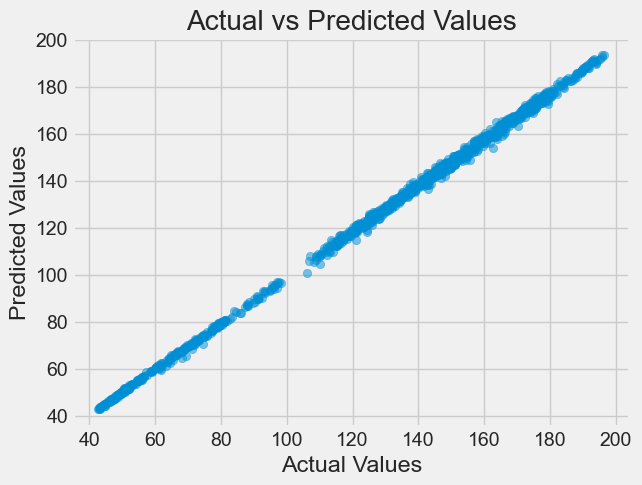

In [74]:
plt.scatter(y_test, y_pred, alpha=0.5)

plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

In [75]:
y_test = y_test.iloc[:, :1]

y_pred_df = pd.DataFrame(y_pred)

y_pred_df.index = y_test.index
y_test_df = pd.DataFrame(y_test)
y_test_df.index = y_test.index


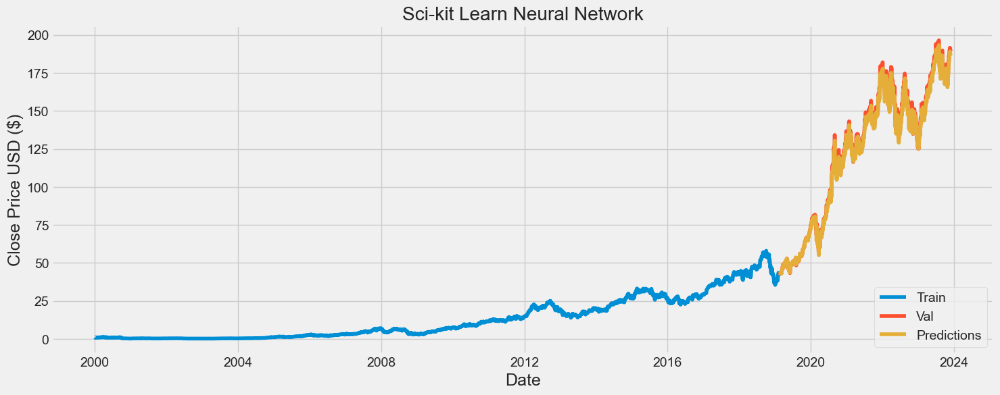

In [76]:
plt.figure(figsize=(16,6))
plt.title('Sci-kit MLP Regressor')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(y_train)
plt.plot(y_test)
plt.plot(y_pred_df)
plt.legend(['Train', 'Val', 'Predictions'], loc='lower right')
plt.show()

In [77]:
y_pred

array([ 43.10073636,  43.00196893,  43.19243975, ..., 187.86868999,
       187.27452741, 187.62795203])

In [78]:
y_test

,Close
Date,
2019-02-20,43.007500
2019-02-21,42.764999
2019-02-22,43.242500
2019-02-25,43.557499
2019-02-26,43.582500
...,...
2023-11-21,190.639999
2023-11-22,191.309998
2023-11-24,189.970001


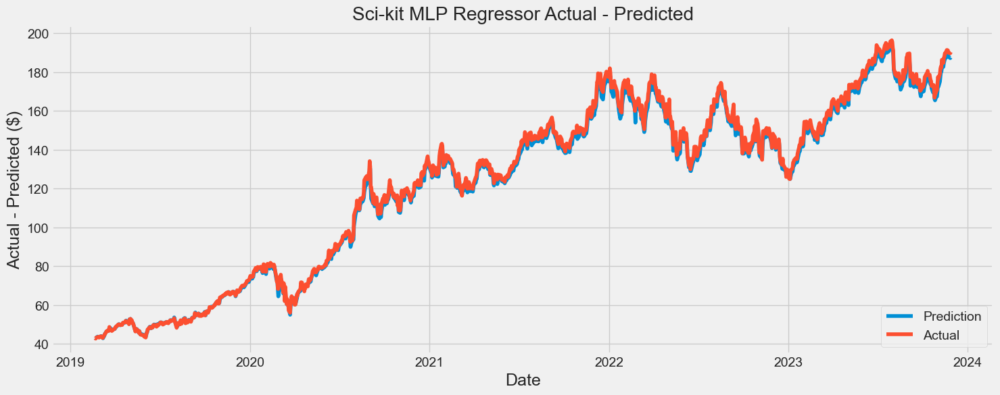

In [79]:
plt.figure(figsize=(16,6))
plt.title('Sci-kit MLP Regressor Actual - Predicted')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Actual - Predicted ($)', fontsize=18)
plt.plot(y_pred_df)
plt.plot(y_test_df)
plt.legend(['Prediction', 'Actual'], loc='lower right')
plt.show()